In [2]:
import cv2
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib import colors
import matplotlib.image as mpimg
import numpy as np

from skimage.morphology import skeletonize
from skimage import data
import matplotlib.pyplot as plt
from skimage.util import invert
import networkx as nx
from skimage.morphology import skeletonize
from skimage import data
import sknw

In [6]:
file = "/Users/carolinehuang/Downloads/archive (1)/test/2014_BC003741_ CC_R.jpg"

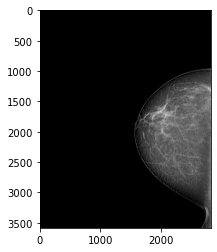

In [7]:
image = cv2.imread(file)
image_invert = invert(image)
image_gray = cv2.imread(file, cv2.IMREAD_GRAYSCALE)
norm_image = cv2.normalize(image, dst=None, alpha=0, beta=65535, norm_type=cv2.NORM_MINMAX)
blur = cv2.GaussianBlur(image,(5,5),0)
plt.imshow(blur)

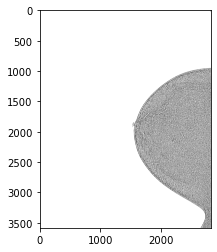

In [8]:
thres_gray = cv2.adaptiveThreshold(image_gray,1,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
    cv2.THRESH_BINARY,11,2)

plt.imshow(thres_gray, 'gray')

In [16]:
np.where(thres_gray == 0, False, True)

array([[ True, False,  True, ..., False,  True,  True],
       [False,  True,  True, ..., False, False, False],
       [ True, False,  True, ...,  True,  True, False],
       ...,
       [False, False,  True, ...,  True,  True, False],
       [ True,  True,  True, ..., False, False,  True],
       [ True, False,  True, ...,  True,  True,  True]])

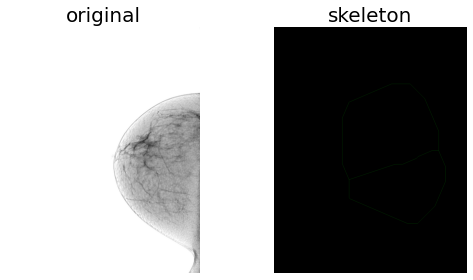

In [9]:
image = cv2.imread(file)
image = invert(image)
skeleton = skeletonize(image)

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(8, 4),
                         sharex=True, sharey=True)

ax = axes.ravel()

ax[0].imshow(image, cmap=plt.cm.gray)
ax[0].axis('off')
ax[0].set_title('original', fontsize=20)

ax[1].imshow(skeleton, cmap=plt.cm.gray)
ax[1].axis('off')
ax[1].set_title('skeleton', fontsize=20)

fig.tight_layout()
plt.show()

Bifurcation

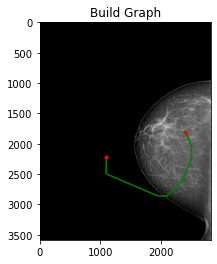

In [10]:
from skimage.morphology import skeletonize
from skimage import data
import sknw

# open and skeletonize
#img = img1


# build graph from skeleton
image_gray = cv2.imread(file, cv2.IMREAD_GRAYSCALE)
image = cv2.imread(file)
image_invert = invert(image)
norm_image = cv2.normalize(image, dst=None, alpha=0, beta=65535, norm_type=cv2.NORM_MINMAX)

ske = skeletonize(image)

graph = sknw.build_sknw(skeleton)

plt.imshow(image, cmap='gray')

# draw edges by pts
for (s,e) in graph.edges():
    ps = graph[s][e]['pts']
    plt.plot(ps[:,1], ps[:,0], 'green')
    
# draw node by o
nodes = graph.nodes()
ps = np.array([nodes[i]['o'] for i in nodes])
plt.plot(ps[:,1], ps[:,0], 'r.')

# title and show
plt.title('Build Graph')
plt.show()

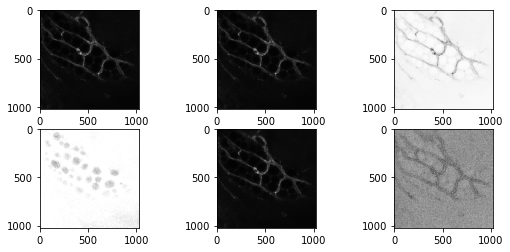

In [10]:
plot_image_grid([image, image_gray, image_invert, norm_image, blur, thres_gray])

In [13]:
test = invert(data.horse())
thres_skel = skeletonize(thres_gray)
test_skel = skeletonize(test)

graph = sknw.build_sknw(test_skel)

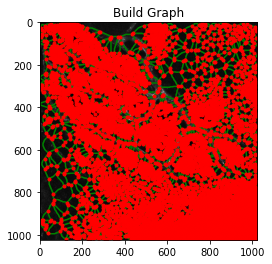

In [17]:
from skimage.morphology import skeletonize
from skimage import data
import sknw

# open and skeletonize
#img = img1
ske = skeletonize(image)

# build graph from skeleton

graph = sknw.build_sknw(ske)

plt.imshow(image, cmap='gray')

# draw edges by pts
for (s,e) in graph.edges():
    ps = graph[s][e]['pts']
    plt.plot(ps[:,1], ps[:,0], 'green')
    
# draw node by o
nodes = graph.nodes()
ps = np.array([nodes[i]['o'] for i in nodes])
plt.plot(ps[:,1], ps[:,0], 'r.')

# title and show
plt.title('Build Graph')
plt.show()

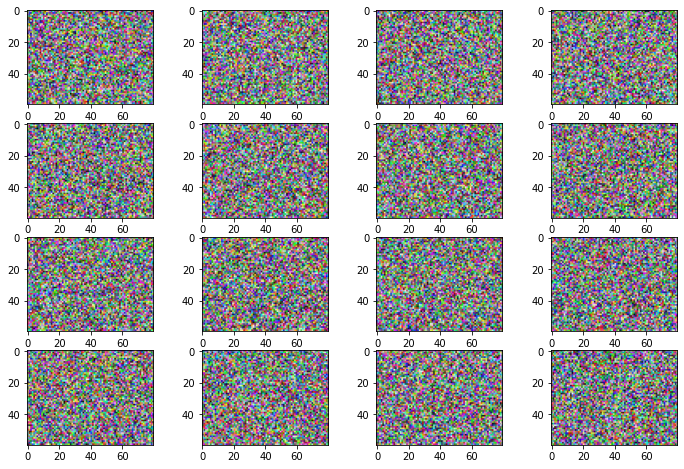

In [7]:
def plot_image_grid(images, ncols=None, cmap='gray'):
    '''Plot a grid of images'''
    if not ncols:
        factors = [i for i in range(1, len(images)+1) if len(images) % i == 0]
        ncols = factors[len(factors) // 2] if len(factors) else len(images) // 4 + 1
    nrows = int(len(images) / ncols) + int(len(images) % ncols)
    imgs = [images[i] if len(images) > i else None for i in range(nrows * ncols)]
    f, axes = plt.subplots(nrows, ncols, figsize=(3*ncols, 2*nrows))
    axes = axes.flatten()[:len(imgs)]
    for img, ax in zip(imgs, axes.flatten()): 
        if np.any(img):
            if len(img.shape) > 2 and img.shape[2] == 1:
                img = img.squeeze()
            ax.imshow(img, cmap=cmap)

# make 16 images with 60 height, 80 width, 3 color channels
images = np.random.rand(16, 60, 80, 3)

# plot them
plot_image_grid(images)

Network Analysis - Morphological Indexes


Network Analysis - Undirected Graph Indexes
Connectivity: average_node_connectivity ~ slow
Clustering: average_clustering
Transport Efficinecy: global_efficiency
Edge Hierarchy: flow_hierarchy

In [147]:
nx.flow_hierarchy(graph)

NetworkXError: G must be a digraph in flow_hierarchy

In [145]:
nx.global_efficiency(graph)

0.07400357133385747

In [142]:
nx.average_clustering(graph)

0.04513277160730242

In [143]:
nx.generalized_degree(graph)

{0: Counter({0: 1}),
 1: Counter({0: 1}),
 2: Counter({0: 1}),
 3: Counter({0: 1}),
 4: Counter({0: 1}),
 5: Counter({1: 2}),
 6: Counter({0: 1, 1: 2}),
 7: Counter({0: 1}),
 8: Counter({0: 1, 1: 2}),
 9: Counter({0: 3}),
 10: Counter({0: 3}),
 11: Counter({0: 3}),
 12: Counter({0: 3}),
 13: Counter({0: 1}),
 14: Counter({0: 3}),
 15: Counter({0: 1, 1: 2}),
 16: Counter({0: 1}),
 17: Counter({0: 4}),
 18: Counter({0: 2}),
 19: Counter({0: 1, 1: 2}),
 20: Counter({0: 2}),
 21: Counter({0: 1, 1: 2}),
 22: Counter({0: 3}),
 23: Counter({0: 3}),
 24: Counter({0: 3}),
 25: Counter({0: 1}),
 26: Counter({0: 3}),
 27: Counter({0: 1}),
 28: Counter({0: 3}),
 29: Counter({0: 3}),
 30: Counter({0: 3}),
 31: Counter({0: 3}),
 32: Counter({0: 3}),
 33: Counter({0: 1}),
 34: Counter({0: 3}),
 35: Counter({0: 3}),
 36: Counter({2: 1, 1: 2}),
 37: Counter({0: 1, 1: 2}),
 38: Counter({0: 1, 1: 2}),
 39: Counter({0: 3}),
 40: Counter({0: 3}),
 41: Counter({0: 3}),
 42: Counter({0: 3}),
 43: Counter({0:

In [139]:
nx.average_node_connectivity(graph)

1.6075426885222304

In [140]:
nx.node_connectivity(graph)

1

In [141]:
nx.all_pairs_node_connectivity(graph)

{0: {1: 1,
  2: 1,
  3: 1,
  4: 1,
  5: 1,
  6: 1,
  7: 1,
  8: 1,
  9: 1,
  10: 1,
  11: 1,
  12: 1,
  13: 1,
  14: 1,
  15: 1,
  16: 1,
  17: 1,
  18: 1,
  19: 1,
  20: 1,
  21: 1,
  22: 1,
  23: 1,
  24: 1,
  25: 1,
  26: 1,
  27: 1,
  28: 1,
  29: 1,
  30: 1,
  31: 1,
  32: 1,
  33: 1,
  34: 1,
  35: 1,
  36: 1,
  37: 1,
  38: 1,
  39: 1,
  40: 1,
  41: 1,
  42: 1,
  43: 1,
  44: 1,
  45: 1,
  46: 1,
  47: 1,
  48: 1,
  49: 1,
  50: 1,
  51: 1,
  52: 1,
  53: 1,
  54: 1,
  55: 1,
  56: 1,
  57: 1,
  58: 1,
  59: 1,
  60: 1,
  61: 1,
  62: 1,
  63: 1,
  64: 1,
  65: 1,
  66: 1,
  67: 1,
  68: 1,
  69: 1,
  70: 1,
  71: 1,
  72: 1,
  73: 1,
  74: 1,
  75: 1,
  76: 1,
  77: 1,
  78: 1,
  79: 1,
  80: 1,
  81: 1,
  82: 1,
  83: 1,
  84: 1,
  85: 1,
  86: 1,
  87: 1,
  88: 1,
  89: 1,
  90: 1,
  91: 1,
  92: 1,
  93: 1,
  94: 1,
  95: 1,
  96: 1,
  97: 1,
  98: 1,
  99: 1,
  100: 1,
  101: 1,
  102: 1,
  103: 1,
  104: 1,
  105: 1,
  106: 1,
  107: 1,
  108: 1,
  109: 1,
  110: 1,
  111

In [85]:
# 1 2 3 
# 4 5 6
# 7 8 9
for org in coords:
    count = 0
    for compare in coords:
        # Check 2
        if compare[0] == org[0] & compare[1] == org[1] + 1:
            count = count + 1
        # Check 3
        if compare[0] == org[0] + 1 & compare[1] == org[1] + 1:
            count = count + 1
        # Check 4
        if compare[0] == org[0] - 1 & compare[1] == org[1]:
            count = count + 1
        # Check 6
        if compare[0] == org[0] + 1 & compare[1] == org[1]:
            count = count + 1
        # Check 7
        if compare[0] == org[0] - 1 & compare[1] == org[1] - 1:
            count = count + 1
        # Check 8
        if compare[0] == org[0] & compare[1] == org[1] - 1:
            count = count + 1
        # Check 9
        if compare[0] == org[0] + 1 & compare[1] == org[1] - 1:
            count = count + 1
    if count >= 3:
        print(org)
        


[57 58  1]
[58 57  1]
[61 62  1]
[62 53  1]
[62 62  1]
[63 62  1]
[94 27  1]
[95 27  1]
[109  72   1]
[109  73   1]
[110  69   1]
[110  70   1]
[110  71   1]
[112  63   1]
[112  64   1]
[112  65   1]
[114  19   1]
[115  19   1]
[116  19   1]
[116  37   1]
[117  19   1]
[118  19   1]
[118  48   1]
[118  49   1]
[119  20   1]
[119  49   1]
[120  19   1]
[120  48   1]
[124 123   1]
[124 124   1]
[125  48   1]
[126  49   1]


KeyboardInterrupt: 

In [51]:
# Bingpot
coords = np.column_stack(np.where(skeleton == 255))
print(coords)

[[   0  924    1]
 [   1  925    0]
 [   2  926    0]
 ...
 [1219 1471    1]
 [1219 1472    1]
 [1219 1473    1]]


In [30]:
pixels = np.asarray(skeleton)
pixels.size

7703289

In [34]:
for 
np.any(skeleton != [0, 0, 0], axis=-1)

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [43]:
count = 0
for x in np.nditer(skeleton):
    if x != 0:
        count = count + 1
print(count)


45614


In [46]:
indices_list = np.where(np.all(skeleton != 0, axis=-1))
indices_list

(array([], dtype=int64), array([], dtype=int64))

In [37]:
for x in skeleton:
    for y in x:
        for z in y:
            if npm.skeleton[x, y, z] != 0:
                print("not black")

IndexError: index 255 is out of bounds for axis 2 with size 3